# STAX enables integration of spatial omics cohort across hundreds of individuals

## Load package

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import pandas as pd
import numpy as np
import torch
import dgl
import random
from scipy.sparse import csr_matrix
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.metrics.cluster import normalized_mutual_info_score

In [4]:
import STA as sta

In [5]:
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
dgl.random.seed(seed)

In [6]:
sc.set_figure_params(dpi=300, figsize=(4, 4), frameon=False)    # TODO 是否画边框

## RNA cohort, 100 slies with around 0.5 million cells

### load data

In [7]:
adata1 = sc.read_h5ad('./data/3Cohort/RNA_NI_discovery_960.h5ad')
adata1

AnnData object with n_obs × n_vars = 491792 × 960
    obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'celltypes', 'cellsubtypes', 'X_coord', 'Y_coord', 'cell_type', 'cell_type_sub', 'batch'
    obsm: 'spatial'

### Use cell type one-hot encoding as feature

In [8]:
adata1.obs.loc[:, 'cell_type_sub'].value_counts()

cell_type_sub
Malignant        314191
Fibroblast        72861
Monocyte          45549
B.cell            16373
Endothelial       13536
CD8.T.cell         8439
NK.cell            6897
T.B.cell           4293
CD4.T.cell.DN      3891
CD4.T.cell         2149
Treg               1905
T.cell.DP          1102
Mast.cell           606
Name: count, dtype: int64

In [9]:
adata_new = sta.pp.cell_type_onehot_encoding(adata1, cell_type_key='cell_type_sub')
adata_new

AnnData object with n_obs × n_vars = 491792 × 13
    obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'celltypes', 'cellsubtypes', 'X_coord', 'Y_coord', 'cell_type', 'cell_type_sub', 'batch'
    obsm: 'spatial'

### Here, we split and preprocess the data

In [10]:
conditions = list(adata_new.obs.loc[:, 'batch'].unique())
len(conditions)

100

In [11]:
data_list = [adata_new[adata_new.obs.loc[:, 'batch'] == condition, :] for condition in conditions]
len(data_list)

100

In [12]:
batch_key = 'batch'
adata = sta.pp.process_adata(data_list, label=batch_key, keys=conditions, n_top_features=False, norm=False, scale=False)
adata

AnnData object with n_obs × n_vars = 491792 × 13
    obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'celltypes', 'cellsubtypes', 'X_coord', 'Y_coord', 'cell_type', 'cell_type_sub', 'batch', 'original_index', 'spot_quality'
    obsm: 'spatial'
    layers: 'counts'

In [13]:
adata.X.max(), adata.X.min()

(1.0, 0.0)

### Construct graph

In [14]:
rad_cutoff_list = [50] * len(data_list)
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list, model='KNN')

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 283000 edges, 5660 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 441050 edges, 8821 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 144050 edges, 2881 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 157250 edges, 3145 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 109350 edges, 2187 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 264750 edges, 5295 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 205850 edges, 4117 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 121400 edges, 2428 cells.
50.0000 neighbors per cell on average.
------Calculating s

### Train

In [15]:
path_results = f'./log/rna_cohort_celltypesub_KNN50/'

In [16]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500 // 250,   # mini batch
                            batch_size=len(adata) // 250,   # mini batch
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [02:41<00:00, 80.88s/it, recon_loss_mse=0.4468, kl_loss=0.0098, lr: 0.0]


In [17]:
adata_STAX

AnnData object with n_obs × n_vars = 491792 × 13
    obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'celltypes', 'cellsubtypes', 'X_coord', 'Y_coord', 'cell_type', 'cell_type_sub', 'batch', 'original_index', 'spot_quality'
    uns: 'adj'
    obsm: 'spatial', 'X_STAX'
    varm: 'gene_embedding'
    layers: 'counts', 'impute'

### Find best k

In [8]:
sta.tl.cluster_stability( 
        adata_STAX,
        n_clusters=(5, 20),
        use_rep='X_STAX',
)

Iteration 7/10: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:12<00:00,  1.48it/s]


Convergence with a change in stability of 0.0096206844621434 reached after 7 iterations


In [9]:
adata_STAX.uns['best_k']

12

In [12]:
Stability_result = adata_STAX.uns['robustness_df'].groupby('K')['Stability'].apply(list).apply(pd.Series)
Stability_result

,0,1,2,3,4,5,6,7,8,9,...,32,33,34,35,36,37,38,39,40,41
K,,,,,,,,,,,,,,,,,,,,,
5,0.899412,0.898557,0.876922,0.914156,0.891480,0.914222,0.828854,0.815011,0.828890,0.815592,...,0.860970,0.861532,0.848955,0.955433,0.849861,0.854491,0.855011,0.842964,0.944701,0.842438
6,0.833107,0.818256,0.816943,0.832536,0.831092,0.828245,0.818293,0.816979,0.814357,0.818706,...,0.892144,0.914934,0.892883,0.914867,0.914514,0.891815,0.914581,0.892554,0.914514,0.891904
7,0.827230,0.829882,0.797071,0.825503,0.793433,0.928779,0.825917,0.793784,0.929363,0.970219,...,0.831599,0.828747,0.833486,0.833022,0.833422,0.831972,0.829114,0.833863,0.833398,0.829099
8,0.964640,0.823059,0.805396,0.798090,0.783198,0.807920,0.802018,0.786926,0.811980,0.812360,...,0.797084,0.935342,0.976059,0.969762,0.809037,0.780762,0.898438,0.940927,0.935865,0.902626
9,0.763346,0.758239,0.949388,0.758007,0.948873,0.906121,0.763363,0.961100,0.915357,0.909598,...,0.803082,0.830988,0.831389,0.822309,0.926988,0.908225,0.937600,0.938042,0.926615,0.924779
10,0.792570,0.831889,0.951922,0.760641,0.840913,0.889461,0.895260,0.914377,0.858164,0.930045,...,0.963545,0.916896,0.907784,0.837257,0.753834,0.937329,0.897738,0.930641,0.819272,0.858158
11,0.850040,0.797331,0.796917,0.942653,0.942215,0.836124,0.952583,0.952059,0.844543,0.850820,...,0.932419,0.900040,0.885502,0.876196,0.760830,0.841334,0.890314,0.773087,0.771619,0.759965
12,0.918038,0.941841,0.816055,0.904458,0.847779,0.852688,0.885461,0.926283,0.762495,0.841912,...,0.976905,0.864340,0.865678,0.971705,0.978036,0.977341,0.866295,0.863295,0.968985,0.974295
13,0.809397,0.872793,0.926838,0.946795,0.840697,0.840191,0.791568,0.750718,0.751310,0.750673,...,0.900388,0.781415,0.863146,0.877163,0.942749,0.878278,0.793835,0.867856,0.857274,0.866191


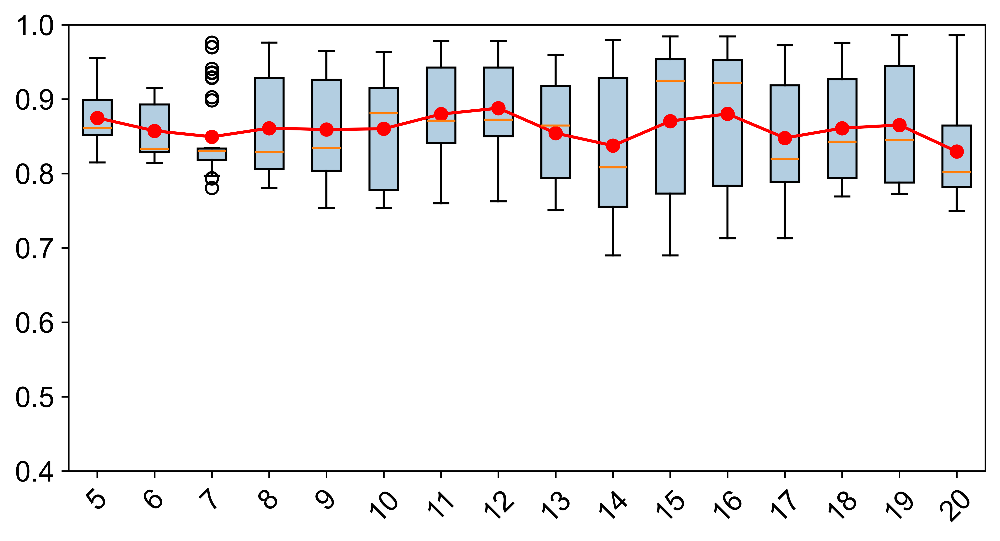

In [15]:
import matplotlib.pyplot as plt
import numpy as np
data = Stability_result.to_numpy().tolist()
means = [np.mean(group) for group in data]
plt.figure(figsize=(8, 4))
plt.boxplot(data, patch_artist=True, boxprops=dict(facecolor=(179/255, 206/255, 225/255))) 

x_positions = range(1, len(data) + 1)  
plt.plot(x_positions, means, marker='o', color='red', label='平均值') 

plt.grid(False)

plt.ylim(0.4, 1.0) 
plt.xticks(ticks=x_positions, labels=[item + 4 for item in list(x_positions)], rotation=45, fontsize=14)

# plt.savefig('./fig_main/1_cell_type_sub_stability.jpg', dpi=300, bbox_inches='tight')
plt.show()


### Clustering

In [13]:
sta.tl.kmeans_cluster(adata_STAX, n_clusters=12, used_embedding='X_STAX')

E:\学习\6科研\论文\博士论文\STAX\code\STA\tools\clustering.py:78: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3 5 8 ... 3 8 3]' has dtype incompatible with category, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:, 'kmeans'] = cell_label
E:\学习\6科研\论文\博士论文\STAX\code\STA\tools\clustering.py:79: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['3' '5' '8' ... '3' '8' '3']' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  adata.obs.loc[:, 'kmeans'] = adata.obs.loc[:, 'kmeans'].astype(str)


AnnData object with n_obs × n_vars = 491792 × 13
    obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'sex', 'celltypes', 'cellsubtypes', 'X_coord', 'Y_coord', 'cell_type', 'cell_type_sub', 'batch', 'original_index', 'spot_quality', 'kmeans'
    uns: 'robustness_df', 'best_k'
    obsm: 'X_STAX', 'spatial'
    varm: 'gene_embedding'
    layers: 'counts', 'impute'

### Visualize Results of mini batch

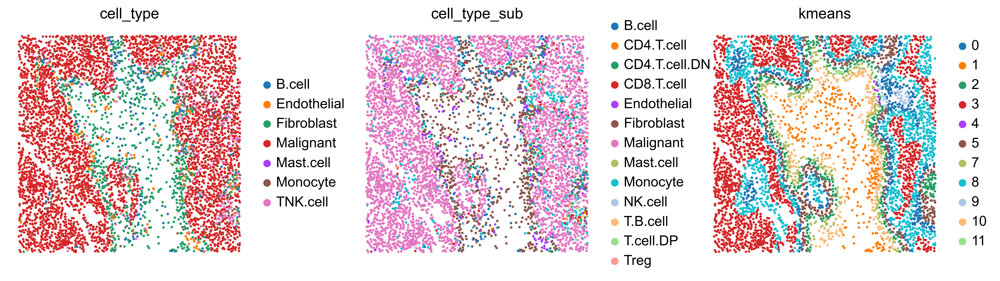

In [19]:
adata_STAX_temp = adata_STAX[adata_STAX.obs.loc[:, 'biosample_id'].isin(['SMI_T10_F001']), :]
sc.pl.embedding(adata_STAX_temp, color=['cell_type', 'cell_type_sub', 'kmeans'], basis='spatial', wspace=0.3, ncols=3)

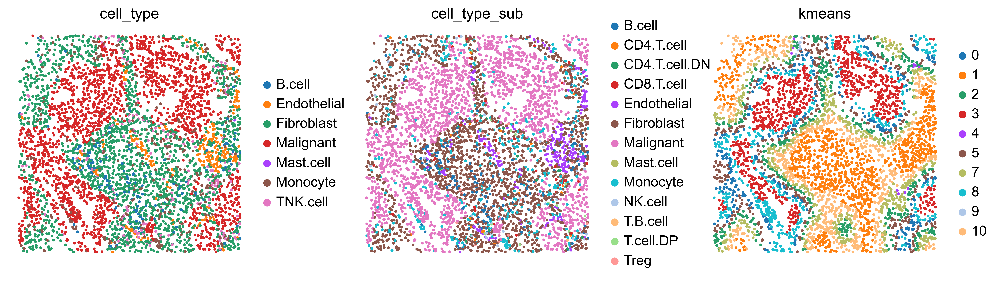

In [10]:
adata_STAX_temp = adata_STAX[adata_STAX.obs.loc[:, 'biosample_id'].isin(['SMI_T12_F002']), :]
sc.pl.embedding(adata_STAX_temp, color=['cell_type', 'cell_type_sub', 'kmeans'], basis='spatial', wspace=0.3, ncols=3)

## Codex cohort, 238 slies with around 2.5 million cells

### load data

In [8]:
adata1 = sc.read_h5ad('./codex_all_subset.h5ad')
adata1

AnnData object with n_obs × n_vars = 2631808 × 36
    obs: 'XMin', 'XMax', 'YMin', 'YMax', 'cellid', 'tumor_phenograph', 'TumorSubtype', 'Class', 'CD4T_phenograph', 'CD4TSubtype', 'CD8T_phenograph', 'CD8TSubtype', 'macrophages_phenograph', 'MacrophagesSubtype', 'Allsubtypes', 'StromalSubtype', 'cell_type', 'cell_type_sub'
    obsm: 'spatial'

In [9]:
len(adata1.obs.loc[:, 'Class'].unique())

238

### Use cell type one-hot encoding as feature

In [10]:
adata_new = sta.pp.cell_type_onehot_encoding(adata1, cell_type_key='cell_type')
adata_new

AnnData object with n_obs × n_vars = 2631808 × 9
    obs: 'XMin', 'XMax', 'YMin', 'YMax', 'cellid', 'tumor_phenograph', 'TumorSubtype', 'Class', 'CD4T_phenograph', 'CD4TSubtype', 'CD8T_phenograph', 'CD8TSubtype', 'macrophages_phenograph', 'MacrophagesSubtype', 'Allsubtypes', 'StromalSubtype', 'cell_type', 'cell_type_sub'
    obsm: 'spatial'

### Here, we split and preprocess the data

In [11]:
conditions = list(adata1.obs.loc[:, 'Class'].unique())
len(conditions)

238

In [12]:
data_list = [adata_new[adata_new.obs.loc[:, 'Class'] == condition, :] for condition in conditions]
len(data_list)

238

In [13]:
batch_key = 'batch'
adata = sta.pp.process_adata(data_list, label=batch_key, keys=conditions, n_top_features=False, norm=False, scale=False)
adata

AnnData object with n_obs × n_vars = 2631808 × 9
    obs: 'XMin', 'XMax', 'YMin', 'YMax', 'cellid', 'tumor_phenograph', 'TumorSubtype', 'Class', 'CD4T_phenograph', 'CD4TSubtype', 'CD8T_phenograph', 'CD8TSubtype', 'macrophages_phenograph', 'MacrophagesSubtype', 'Allsubtypes', 'StromalSubtype', 'cell_type', 'cell_type_sub', 'original_index', 'spot_quality', 'batch'
    obsm: 'spatial'
    layers: 'counts'

### Construct graph

In [16]:
rad_cutoff_list = [50] * len(data_list)
adata, g = sta.pp.process_graph(adata, data_list, cutoff_list=rad_cutoff_list)

cal spatial net in data_list
------Calculating spatial graph...
The graph contains 92228 edges, 10588 cells.
8.7106 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 110010 edges, 12582 cells.
8.7434 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 78446 edges, 9870 cells.
7.9479 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 113022 edges, 12687 cells.
8.9085 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 87126 edges, 10114 cells.
8.6144 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 53014 edges, 7627 cells.
6.9508 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 65636 edges, 8671 cells.
7.5696 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 59704 edges, 7698 cells.
7.7558 neighbors per cell on average.
------Calculating spatial gra

### Train

In [8]:
path_results = f'./log/integration_all_subset/'

In [18]:
adata_STAX = sta.model.STAX(adata=adata,
                            n_epoch=500 // 250,
                            batch_size=len(adata) // 250,
                            verbose=False,
                            gpu=0,
                            random_seed=42,
                            output_dir=path_results,
                            )

Epochs: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [07:07<00:00, 213.88s/it, recon_loss_mse=0.4128, kl_loss=0.0007, lr: 0.0]


### Find best k

In [27]:
sta.tl.cluster_stability( 
        adata_STAX,
        n_clusters=(5, 20),
        use_rep='X_STAX',
)

Iteration 8/10: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [01:34<00:00,  5.26s/it]


Convergence with a change in stability of 0.007625917343386426 reached after 8 iterations


In [28]:
adata_STAX.uns['best_k']

14

In [32]:
Stability_result = adata_STAX.uns['robustness_df'].groupby('K')['Stability'].apply(list).apply(pd.Series)
Stability_result

,0,1,2,3,4,5,6,7,8,9,...,46,47,48,49,50,51,52,53,54,55
K,,,,,,,,,,,,,,,,,,,,,
5,0.958009,0.585241,0.582472,0.761043,0.768003,0.736397,0.957626,0.946683,0.592916,0.582476,...,0.957580,0.772297,0.769086,0.905912,0.905519,0.566682,0.714595,0.905943,0.566101,0.566962
6,0.949575,0.572543,0.572548,0.582007,0.582010,0.591044,0.924712,0.924705,0.958692,0.957469,...,0.936189,0.599346,0.585474,0.957968,0.946876,0.592576,0.582521,0.964003,0.958253,0.946888
7,0.798052,0.791294,0.806720,0.792713,0.808093,0.984909,0.792105,0.807527,0.984738,0.880756,...,0.946015,0.946791,0.771065,0.949981,0.949951,0.962113,0.960172,0.960880,0.772485,0.960162
8,0.912191,0.768003,0.774630,0.778771,0.775175,0.783505,0.564164,0.564500,0.571177,0.612370,...,0.881252,0.708293,0.945543,0.782974,0.796843,0.945255,0.851986,0.678296,0.947443,0.680929
9,0.928114,0.912465,0.793895,0.800276,0.932072,0.610401,0.562569,0.624418,0.981113,0.982985,...,0.598531,0.932068,0.978942,0.773877,0.770165,0.788266,0.895863,0.637661,0.643683,0.971509
10,0.789042,0.558700,0.848633,0.558244,0.844484,0.841923,0.560707,0.907245,0.901328,0.897519,...,0.632238,0.663251,0.648677,0.780122,0.962020,0.632659,0.631198,0.661368,0.647656,0.957696
11,0.570055,0.571637,0.709506,0.572189,0.711856,0.705975,0.671713,0.897667,0.898002,0.897591,...,0.712538,0.672208,0.709559,0.790164,0.704456,0.709807,0.712410,0.672212,0.709371,0.918826
12,0.699300,0.702143,0.930091,0.699221,0.926209,0.926203,0.694674,0.931225,0.931357,0.890162,...,0.694863,0.710669,0.720558,0.771971,0.692826,0.692821,0.692841,0.707142,0.717394,0.713137
13,0.922961,0.922791,0.955435,0.875004,0.884547,0.886776,0.925338,0.959099,0.969341,0.935373,...,0.683568,0.727782,0.713772,0.582555,0.727794,0.728007,0.687826,0.725680,0.712864,0.582279


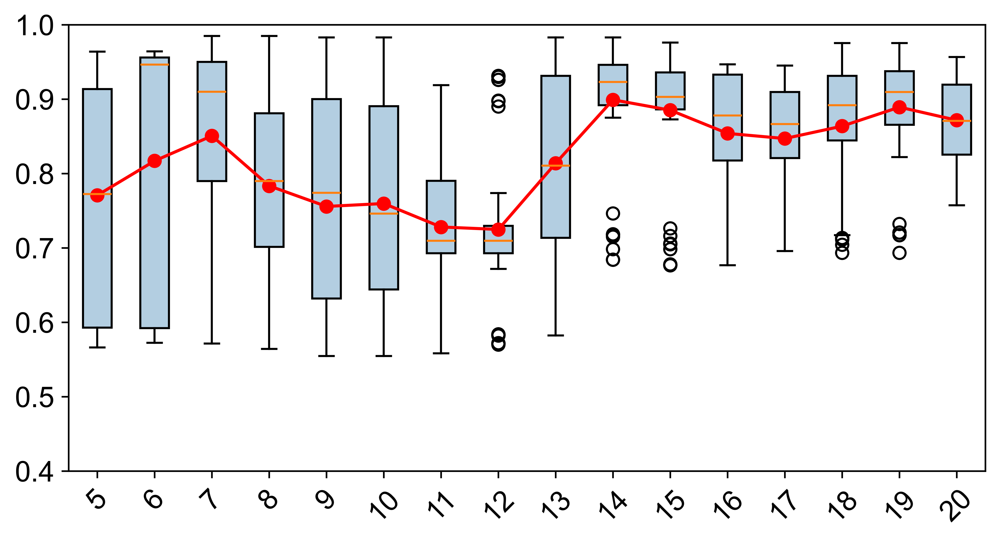

In [33]:
import matplotlib.pyplot as plt
import numpy as np
data = Stability_result.to_numpy().tolist()
means = [np.mean(group) for group in data]
plt.figure(figsize=(8, 4))
plt.boxplot(data, patch_artist=True, boxprops=dict(facecolor=(179/255, 206/255, 225/255))) 

x_positions = range(1, len(data) + 1)  
plt.plot(x_positions, means, marker='o', color='red', label='平均值') 

plt.grid(False)

plt.ylim(0.4, 1.0) 
plt.xticks(ticks=x_positions, labels=[item + 4 for item in list(x_positions)], rotation=45, fontsize=14)

# plt.savefig('./fig_main/1_cell_type_sub_stability.jpg', dpi=300, bbox_inches='tight')
plt.show()


### Clustering

In [34]:
sta.tl.kmeans_cluster(adata_STAX, n_clusters=14, used_embedding='X_STAX')

AnnData object with n_obs × n_vars = 2631808 × 9
    obs: 'XMin', 'XMax', 'YMin', 'YMax', 'cellid', 'tumor_phenograph', 'TumorSubtype', 'Class', 'CD4T_phenograph', 'CD4TSubtype', 'CD8T_phenograph', 'CD8TSubtype', 'macrophages_phenograph', 'MacrophagesSubtype', 'Allsubtypes', 'StromalSubtype', 'cell_type', 'spot_quality', 'batch', 'kmeans'
    uns: 'cell_type_colors', 'kmeans_colors', 'neighbors', 'umap', 'robustness_df', 'best_k'
    obsm: 'X_STAX', 'X_umap', 'spatial'
    varm: 'gene_embedding'
    layers: 'counts', 'impute'
    obsp: 'connectivities', 'distances'

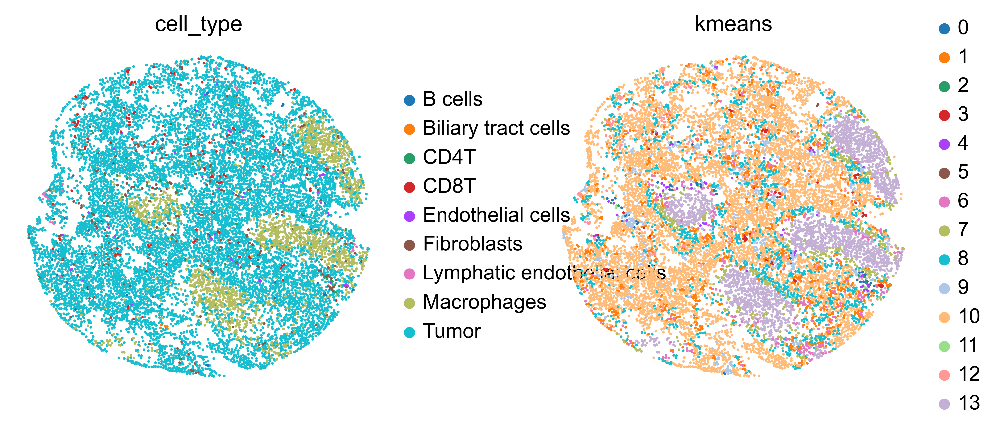

In [40]:
adata_STAX_temp = adata_STAX[adata_STAX.obs.loc[:, 'batch'].isin(['TMA3_8_reg036']), :]
sc.pl.embedding(adata_STAX_temp, color=['cell_type', 'kmeans'], basis='spatial', wspace=0.3, ncols=3)